In [2]:
import sys
from pathlib import Path

# Add project root and sam2 module to path
project_root = Path.cwd().parent
sys.path.insert(0, str(project_root))
sys.path.insert(0, str(project_root / "segment-anything-2-real-time"))

import src.env
from src.config import VIDEO_DIR
from IPython.display import Video
from typing import Dict, List, Optional, Union, Iterable, Tuple
from operator import itemgetter

import cv2
import numpy as np
import torch
from tqdm import tqdm
import os

import supervision as sv
from inference import get_model
from sports import (
    clean_paths,
    ConsecutiveValueTracker,
    TeamClassifier,
    MeasurementUnit,
    ViewTransformer
)
from sports.basketball import (
    CourtConfiguration,
    League,
    draw_court,
    draw_points_on_court,
    draw_paths_on_court,
    draw_made_and_miss_on_court,
    ShotEventTracker
)

[02/01/26 21:58:15] WARNING  Your inference package version 0.64.5 is out of date! Please upgrade to ]8;id=308783;file://d:\Downloads\nfl_player_detection\.venv\lib\site-packages\inference\core\__init__.py\__init__.py]8;;\:]8;id=722897;file://d:\Downloads\nfl_player_detection\.venv\lib\site-packages\inference\core\__init__.py#41\41]8;;\
                             version 0.64.6 of inference for the latest features and bug fixes by                  
                             running `pip install --upgrade inference`.                                            

ModelDependencyMissing: Your `inference` configuration does not support SAM model. Use pip install 'inference[sam]' to install missing requirements.To suppress this warning, set CORE_MODEL_SAM_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support SAM3 model. Install SAM3 dependencies and set CORE_MODEL_SAM3_ENABLED to True.
ModelDependencyMissing: Your `inference` configuration does not support Gaze Detection model. Use pip install 'inference[gaze]' to install missing requirements.To suppress this warning, set CORE_MODEL_GAZE_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support YoloWorld model. Use pip install 'inference[yolo-world]' to install missing requirements.To suppress this warning, set CORE_MODEL_YOLO_WORLD_ENABLED to False.


In [5]:
SOURCE_VIDEO_PATH = VIDEO_DIR / "off_play1.mp4"
PLAYER_DETECTION_MODEL_ID = "player-detection-h1a6d/1"
PLAYER_DETECTION_MODEL_CONFIDENCE = 0.4
PLAYER_DETECTION_MODEL_IOU_THRESHOLD = 0.9
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID)

COLOR = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
    "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])

Resolved model_id: player-detection-h1a6d/1, dataset_id: player-detection-h1a6d, version_id: 1


In [7]:
YARDNUMBER_DETECTION_MODEL_ID = "bueob/yardline-v3"
YARDNUMBER_DETECTION_MODEL_CONFIDENCE = 0.4
YARDNUMBER_DETECTION_MODEL_IOU_THRESHOLD = 0.9
YARDNUMBER_DETECTION_MODEL = get_model(model_id=YARDNUMBER_DETECTION_MODEL_ID)

COLOR = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
    "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])

Resolved model_id: bueob/yardline-v3, dataset_id: bueob/yardline-v3, version_id: None


RoboflowAPIForbiddenError: Unauthorized access to roboflow API - check API key regarding correctness and required scopes. Visit https://docs.roboflow.com/api-reference/authentication#retrieve-an-api-key to learn how to retrieve one.

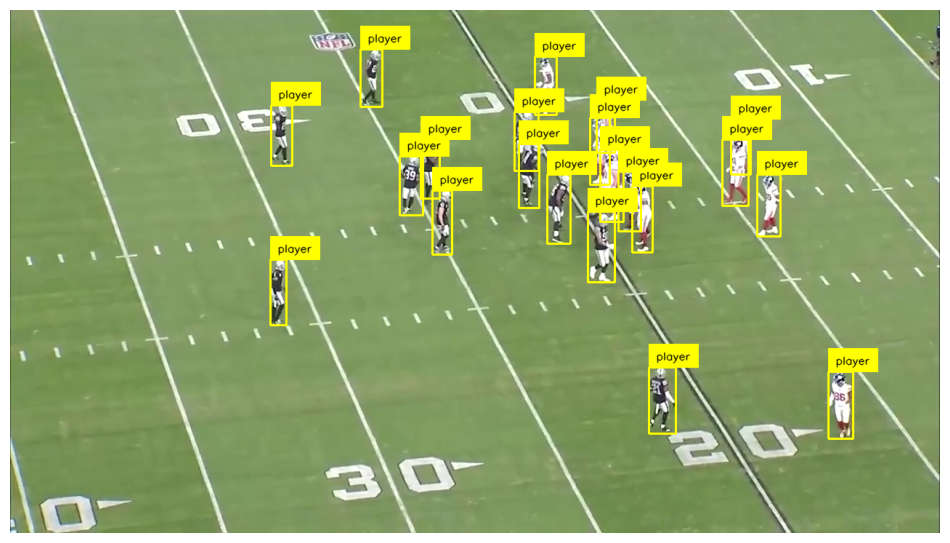

In [4]:
box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections)

sv.plot_image(annotated_frame)

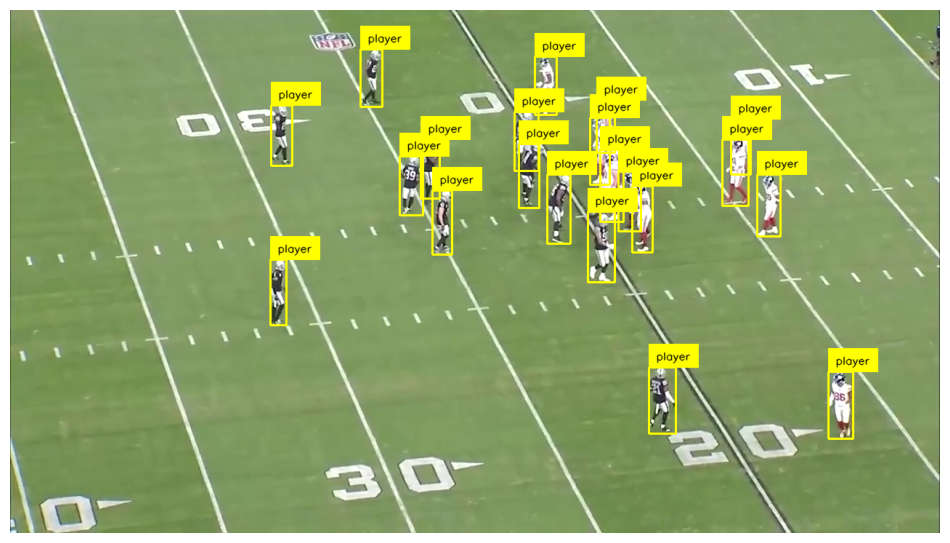

In [6]:
box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = YARDNUMBER_DETECTION_MODEL.infer(frame, confidence=YARDNUMBER_DETECTION_MODEL_CONFIDENCE, iou_threshold=YARDNUMBER_DETECTION_MODEL_IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections)

sv.plot_image(annotated_frame)

In [6]:
TARGET_VIDEO_PATH = Path(SOURCE_VIDEO_PATH.parent) / f"{SOURCE_VIDEO_PATH.stem}-detection{SOURCE_VIDEO_PATH.suffix}"
TARGET_VIDEO_COMPRESSED_PATH = TARGET_VIDEO_PATH.parent / f"{TARGET_VIDEO_PATH.stem}-compressed{TARGET_VIDEO_PATH.suffix}"

box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

def callback(frame: np.ndarray, index: int) -> np.ndarray:
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD)[0]
    detections = sv.Detections.from_inference(result)

    annotated_frame = frame.copy()
    annotated_frame = box_annotator.annotate(
        scene=annotated_frame,
        detections=detections)
    annotated_frame = label_annotator.annotate(
        scene=annotated_frame,
        detections=detections)
    return annotated_frame

sv.process_video(
    source_path=SOURCE_VIDEO_PATH,
    target_path=TARGET_VIDEO_PATH,
    callback=callback,
    show_progress=True
)

!ffmpeg -y -loglevel error -i {TARGET_VIDEO_PATH} -vcodec libx264 -crf 28 {TARGET_VIDEO_COMPRESSED_PATH}

Processing video: 100%|██████████| 501/501 [00:15<00:00, 31.87it/s]


In [7]:
Video(TARGET_VIDEO_COMPRESSED_PATH, embed=True, width=720)

In [11]:
from sam2.build_sam import build_sam2_camera_predictor

SAM2_CHECKPOINT = "checkpoints/sam2.1_hiera_large.pt"
SAM2_CONFIG = "configs/sam2.1/sam2.1_hiera_l.yaml"

predictor = build_sam2_camera_predictor(SAM2_CONFIG, SAM2_CHECKPOINT)

FileNotFoundError: [Errno 2] No such file or directory: 'checkpoints/sam2.1_hiera_large.pt'

In [18]:
from __future__ import annotations

class SAM2Tracker:
    def __init__(self, predictor) -> None:
        self.predictor = predictor
        self._prompted = False

    def prompt_first_frame(self, frame: np.ndarray, detections: sv.Detections) -> None:
        if len(detections) == 0:
            raise ValueError("detections must contain at least one box")

        if detections.tracker_id is None:
            detections.tracker_id = list(range(1, len(detections) + 1))

        with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
            self.predictor.load_first_frame(frame)
            for xyxy, obj_id in zip(detections.xyxy, detections.tracker_id):
                bbox = np.asarray([xyxy], dtype=np.float32)
                self.predictor.add_new_prompt(
                    frame_idx=0,
                    obj_id=int(obj_id),
                    bbox=bbox,
                )

        self._prompted = True

    def propagate(self, frame: np.ndarray) -> sv.Detections:
        if not self._prompted:
            raise RuntimeError("Call prompt_first_frame before propagate")

        with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
            tracker_ids, mask_logits = self.predictor.track(frame)

        tracker_ids = np.asarray(tracker_ids, dtype=np.int32)
        masks = (mask_logits > 0.0).cpu().numpy()
        masks = np.squeeze(masks).astype(bool)

        if masks.ndim == 2:
            masks = masks[None, ...]

        masks = np.array([
            sv.filter_segments_by_distance(mask, relative_distance=0.03, mode="edge")
            for mask in masks
        ])

        xyxy = sv.mask_to_xyxy(masks=masks)
        detections = sv.Detections(xyxy=xyxy, mask=masks, tracker_id=tracker_ids)
        return detections

    def reset(self) -> None:
        self._prompted = False

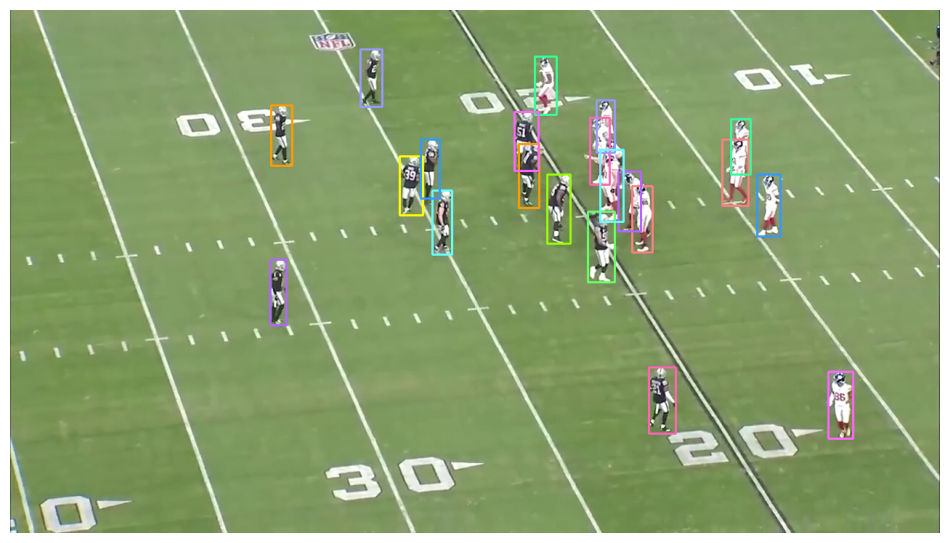

Processing video: 100%|██████████| 501/501 [12:41<00:00,  1.52s/it]


In [19]:
TARGET_VIDEO_PATH = Path(SOURCE_VIDEO_PATH.parent) / f"{SOURCE_VIDEO_PATH.stem}-detection{SOURCE_VIDEO_PATH.suffix}"
TARGET_VIDEO_COMPRESSED_PATH = TARGET_VIDEO_PATH.parent / f"{TARGET_VIDEO_PATH.stem}-compressed{TARGET_VIDEO_PATH.suffix}"
PLAYER_CLASS_IDS = [0]
# define team annotators

mask_annotator = sv.MaskAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    opacity=0.5)
box_annotator = sv.BoxAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    thickness=2
)

# we use RF-DETR model to aquire future SAM2 prompt

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)
detections = detections[np.isin(detections.class_id, PLAYER_CLASS_IDS)]
detections.tracker_id = np.arange(1, len(detections.class_id) + 1)

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
sv.plot_image(annotated_frame)

# we prompt SAM2 using RF-DETR model detections

tracker = SAM2Tracker(predictor)
tracker.prompt_first_frame(frame, detections)

# we propagate tacks across all video frames

def callback(frame: np.ndarray, index: int) -> np.ndarray:
    detections = tracker.propagate(frame)
    annotated_frame = frame.copy()
    annotated_frame = mask_annotator.annotate(scene=annotated_frame, detections=detections)
    annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
    return annotated_frame

sv.process_video(
    source_path=SOURCE_VIDEO_PATH,
    target_path=TARGET_VIDEO_PATH,
    callback=callback,
    show_progress=True
)

!ffmpeg -y -loglevel error -i {TARGET_VIDEO_PATH} -vcodec libx264 -crf 28 {TARGET_VIDEO_COMPRESSED_PATH}

In [20]:
Video(TARGET_VIDEO_COMPRESSED_PATH, embed=True, width=720)

In [46]:
STRIDE = 30
SHIFT_RATIO = 0.20   # move crop up by 20% of its height

crops = []

for video_path in sv.list_files_with_extensions(VIDEO_DIR, extensions=["mp4", "avi", "mov"]):
    frame_generator = sv.get_video_frames_generator(source_path=video_path, stride=STRIDE)

    for frame in tqdm(frame_generator):
        result = PLAYER_DETECTION_MODEL.infer(
            frame,
            confidence=PLAYER_DETECTION_MODEL_CONFIDENCE,
            iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD,
            class_agnostic_nms=True
        )[0]

        detections = sv.Detections.from_inference(result)
        detections = detections[np.isin(detections.class_id, PLAYER_CLASS_IDS)]

        boxes = sv.scale_boxes(xyxy=detections.xyxy, factor=0.4)

        H, W = frame.shape[:2]

        for box in boxes:
            x1, y1, x2, y2 = box.astype(int)

            # shift up, keep same height
            box_h = y2 - y1
            shift = int(box_h * SHIFT_RATIO)

            y1_new = y1 - shift
            y2_new = y2 - shift

            # clamp to image bounds while preserving height if possible
            if y1_new < 0:
                y2_new -= y1_new   # subtracting a negative adds
                y1_new = 0
            if y2_new > H:
                overflow = y2_new - H
                y1_new -= overflow
                y2_new = H
                y1_new = max(0, y1_new)

            # clamp x too (just in case)
            x1 = max(0, x1); x2 = min(W, x2)

            # skip invalid boxes
            if x2 <= x1 or y2_new <= y1_new:
                continue

            crops.append(sv.crop_image(frame, np.array([x1, y1_new, x2, y2_new])))


0it [00:00, ?it/s]

15it [00:01, 10.59it/s]
15it [00:00, 15.63it/s]
17it [00:00, 20.66it/s]
17it [00:00, 21.99it/s]
17it [00:01, 14.96it/s]


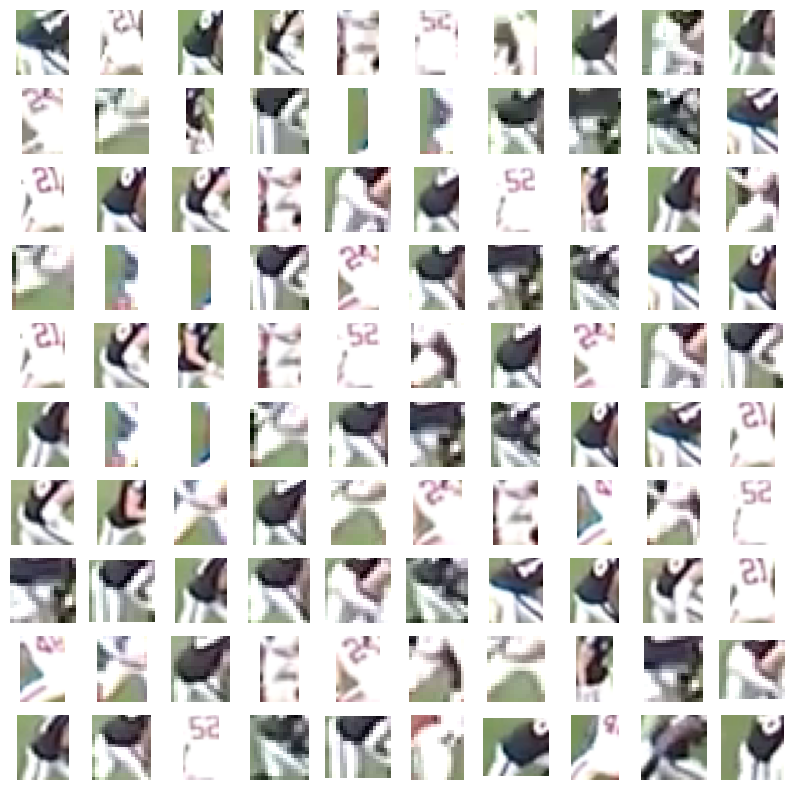

In [47]:
sv.plot_images_grid(
    images=crops[:100],
    grid_size=(10, 10),
    size=(10, 10)
)

In [48]:
team_classifier = TeamClassifier(device="cuda")
team_classifier.fit(crops)

Embedding extraction: 39it [00:09,  3.94it/s]


In [1]:
teams = team_classifier.predict(crops)

team_0 = [crop for crop, team in zip(crops, teams) if team == 0]
team_1 = [crop for crop, team in zip(crops, teams) if team == 1]

sv.plot_images_grid(
    images=team_0[:50],
    grid_size=(5, 10),
    size=(10, 5)
)

sv.plot_images_grid(
    images=team_1[:50],
    grid_size=(5, 10),
    size=(10, 5)
)

NameError: name 'team_classifier' is not defined

Embedding extraction: 1it [00:00,  5.62it/s]


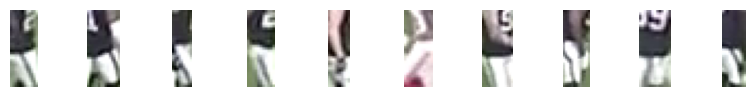

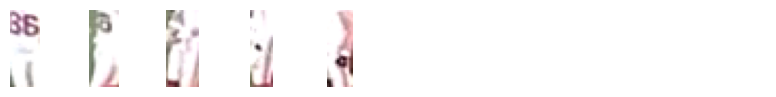

In [50]:
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD, class_agnostic_nms=True)[0]
detections = sv.Detections.from_inference(result)
detections = detections[np.isin(detections.class_id, PLAYER_CLASS_IDS)]

boxes = sv.scale_boxes(xyxy=detections.xyxy, factor=0.4)
crops = [sv.crop_image(frame, box) for box in boxes]
teams = np.array(team_classifier.predict(crops))

team_0 = [crop for crop, team in zip(crops, teams) if team == 0]
team_1 = [crop for crop, team in zip(crops, teams) if team == 1]

sv.plot_images_grid(
    images=team_0[:10],
    grid_size=(1, 10),
    size=(10, 1)
)

sv.plot_images_grid(
    images=team_1[:10],
    grid_size=(1, 10),
    size=(10, 1)
)

In [51]:
TEAM_NAMES = {
    0: "Las Vegas Raiders",
    1: "New York Giants",
}

In [ ]:
TARGET_VIDEO_PATH = Path(SOURCE_VIDEO_PATH.parent) / f"{SOURCE_VIDEO_PATH.stem}-detection{SOURCE_VIDEO_PATH.suffix}"
TARGET_VIDEO_COMPRESSED_PATH = TARGET_VIDEO_PATH.parent / f"{TARGET_VIDEO_PATH.stem}-compressed{TARGET_VIDEO_PATH.suffix}"

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# define team annotators

team_colors = sv.ColorPalette.from_hex([
    TEAM_COLORS[TEAM_NAMES[0]],
    TEAM_COLORS[TEAM_NAMES[1]]
])

team_mask_annotator = sv.MaskAnnotator(
    color=team_colors,
    opacity=0.5,
    color_lookup=sv.ColorLookup.INDEX
)

team_box_annotator = sv.BoxAnnotator(
    color=team_colors,
    thickness=2,
    color_lookup=sv.ColorLookup.INDEX
)

# we use RF-DETR model to aquire future SAM2 prompt

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)
detections = detections[np.isin(detections.class_id, PLAYER_CLASS_IDS)]
detections.tracker_id = np.arange(1, len(detections.class_id) + 1)

# we determine the team for each player and assign a team ID to every detection

boxes = sv.scale_boxes(xyxy=detections.xyxy, factor=0.4)
crops = [sv.crop_image(frame, box) for box in boxes]
TEAMS = np.array(team_classifier.predict(crops))

# we prompt SAM2 using RF-DETR model detections

tracker = SAM2Tracker(predictor)
tracker.prompt_first_frame(frame, detections)

# we propagate tacks across all video frames

def callback(frame: np.ndarray, index: int) -> np.ndarray:
    detections = tracker.propagate(frame)
    annotated_frame = frame.copy()
    annotated_frame = team_mask_annotator.annotate(
        scene=annotated_frame,
        detections=detections,
        custom_color_lookup=TEAMS[detections.tracker_id - 1]
    )
    annotated_frame = team_box_annotator.annotate(
        scene=annotated_frame,
        detections=detections,
        custom_color_lookup=TEAMS[detections.tracker_id - 1]
    )
    return annotated_frame

sv.process_video(
    source_path=SOURCE_VIDEO_PATH,
    target_path=TARGET_VIDEO_PATH,
    callback=callback,
    show_progress=True
)

!ffmpeg -y -loglevel error -i {TARGET_VIDEO_PATH} -vcodec libx264 -crf 28 {TARGET_VIDEO_COMPRESSED_PATH}

Embedding extraction: 1it [00:00,  5.56it/s]
Processing video:   1%|▏         | 7/501 [00:05<07:11,  1.15it/s]

In [39]:
Video(TARGET_VIDEO_COMPRESSED_PATH, embed=True, width=720)